In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
df = pd.read_csv("C:\\Users\\vmadmin\\Documents\\GitHub\\RegressionAnalysis-CarPricePrediction\\car_price_prediction.csv")

In [150]:
df.head(10)

,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags
0,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005 km,6.0,Automatic,4x4,04-May,Left wheel,Silver,12
1,16621,1018,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,192000 km,6.0,Tiptronic,4x4,04-May,Left wheel,Black,8
2,8467,-,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000 km,4.0,Variator,Front,04-May,Right-hand drive,Black,2
3,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966 km,4.0,Automatic,4x4,04-May,Left wheel,White,0
4,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901 km,4.0,Automatic,Front,04-May,Left wheel,Silver,4
5,39493,891,HYUNDAI,Santa FE,2016,Jeep,Yes,Diesel,2,160931 km,4.0,Automatic,Front,04-May,Left wheel,White,4
6,1803,761,TOYOTA,Prius,2010,Hatchback,Yes,Hybrid,1.8,258909 km,4.0,Automatic,Front,04-May,Left wheel,White,12
7,549,751,HYUNDAI,Sonata,2013,Sedan,Yes,Petrol,2.4,216118 km,4.0,Automatic,Front,04-May,Left wheel,Grey,12
8,1098,394,TOYOTA,Camry,2014,Sedan,Yes,Hybrid,2.5,398069 km,4.0,Automatic,Front,04-May,Left wheel,Black,12
9,26657,-,LEXUS,RX 350,2007,Jeep,Yes,Petrol,3.5,128500 km,6.0,Automatic,4x4,04-May,Left wheel,Silver,12


In [5]:
# df.info
df.describe()

,ID,Price,Prod. year,Cylinders,Airbags
count,1.923700e+04,1.923700e+04,19237.000000,19237.000000,19237.000000
mean,4.557654e+07,1.855593e+04,2010.912824,4.582991,6.582627
std,9.365914e+05,1.905813e+05,5.668673,1.199933,4.320168
min,2.074688e+07,1.000000e+00,1939.000000,1.000000,0.000000
25%,4.569837e+07,5.331000e+03,2009.000000,4.000000,4.000000
50%,4.577231e+07,1.317200e+04,2012.000000,4.000000,6.000000
75%,4.580204e+07,2.207500e+04,2015.000000,4.000000,12.000000
max,4.581665e+07,2.630750e+07,2020.000000,16.000000,16.000000


In [6]:
df.drop('ID', axis=1, inplace=True)

In [7]:
df.describe()

,Price,Prod. year,Cylinders,Airbags
count,1.923700e+04,19237.000000,19237.000000,19237.000000
mean,1.855593e+04,2010.912824,4.582991,6.582627
std,1.905813e+05,5.668673,1.199933,4.320168
min,1.000000e+00,1939.000000,1.000000,0.000000
25%,5.331000e+03,2009.000000,4.000000,4.000000
50%,1.317200e+04,2012.000000,4.000000,6.000000
75%,2.207500e+04,2015.000000,4.000000,12.000000
max,2.630750e+07,2020.000000,16.000000,16.000000


In [8]:
# sns.pairplot(df)

## REMOVE EXTREME VALUES from 'PRICE'

In [9]:
import plotly.express as px

### Boxplot ###

In [151]:
# figbp1 = px.box(df_fin,x='Prod. year',y='Price')
# figbp1.show()
figbp1 = px.box(df,y='Price',points='all') #points='all'
figbp1.show()

In [11]:
# figbp1 = px.plot(df_fin,x='',y='Price')
len(df[(df['Price']>48000)])

1035

##### We change the max price range to 50000 as the box plot shows that anything above 50 is outside the box plot max range and should be dealt with as an outlier


In [153]:
px.box(df,y='Price',points='all')

In [12]:
df['Price'].describe()

count    1.923700e+04
mean     1.855593e+04
std      1.905813e+05
min      1.000000e+00
25%      5.331000e+03
50%      1.317200e+04
75%      2.207500e+04
max      2.630750e+07
Name: Price, dtype: float64

In [13]:
quant1 = df['Price'].quantile(0.25)
quant3 = df['Price'].quantile(0.75)
iqr = quant3 - quant1
iqr

16744.0

In [14]:
lower_lim = quant1 - 1.5*iqr
if lower_lim<=0:
    lower_lim = 0
upper_lim = quant3 + 1.55*iqr

In [15]:
lower_lim,upper_lim

(0, 48028.2)

In [16]:
outlier_low = df['Price'] <= lower_lim
outlier_high = df['Price'] >=upper_lim

# len(df[(outlier_low | outlier_high)])
df[(outlier_low | outlier_high)]

,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags
14,59464,891,HYUNDAI,Santa FE,2016,Jeep,Yes,Diesel,2,76000 km,4.0,Automatic,Front,04-May,Left wheel,White,4
36,51746,1077,TOYOTA,CHR Limited,2019,Jeep,No,Petrol,2,10200 km,4.0,Tiptronic,Front,04-May,Left wheel,Red,12
47,55390,1017,HYUNDAI,Santa FE,2017,Jeep,Yes,Diesel,2,100734 km,4.0,Automatic,Front,04-May,Left wheel,Black,4
56,87112,-,MERCEDES-BENZ,GLA 250,2019,Jeep,Yes,Petrol,2.0 Turbo,5323 km,4.0,Tiptronic,4x4,04-May,Left wheel,Grey,0
73,53154,891,HYUNDAI,Santa FE,2016,Jeep,Yes,Diesel,2,84506 km,4.0,Automatic,Front,04-May,Left wheel,Silver,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19144,56814,1017,HYUNDAI,Sonata,2017,Sedan,Yes,Petrol,2,67365 km,4.0,Automatic,Front,04-May,Left wheel,Black,4
19161,64290,-,LEXUS,RX 450 F SPORT,2012,Jeep,Yes,Hybrid,3.5,97000 km,6.0,Variator,4x4,04-May,Left wheel,Black,12
19180,63886,1076,HYUNDAI,Sonata,2020,Sedan,Yes,LPG,2,5305 km,4.0,Automatic,Front,04-May,Left wheel,Silver,4
19188,61154,579,TOYOTA,RAV 4,2017,Jeep,No,Hybrid,2.5,71234 km,4.0,Tiptronic,4x4,04-May,Left wheel,White,12


In [17]:
df_fin = df[~(outlier_low | outlier_high)].copy()
# df_fin

#### Updated Barplot

In [152]:
px.box(df_fin,y='Price',points='all')

### Update door column and extract only doors


In [19]:
new_door_list = df_fin['Doors'].astype('str').str.extractall('(\d+)').unstack().fillna('').sum(axis=1).astype(int)

In [20]:
df_fin.drop('Doors',axis=1,inplace=True)
df_fin.head(5)

,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Wheel,Color,Airbags
0,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005 km,6.0,Automatic,4x4,Left wheel,Silver,12
1,16621,1018,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,192000 km,6.0,Tiptronic,4x4,Left wheel,Black,8
2,8467,-,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000 km,4.0,Variator,Front,Right-hand drive,Black,2
3,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966 km,4.0,Automatic,4x4,Left wheel,White,0
4,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901 km,4.0,Automatic,Front,Left wheel,Silver,4


In [21]:
df_fin['Doors'] = new_door_list
df_fin

,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Wheel,Color,Airbags,Doors
0,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005 km,6.0,Automatic,4x4,Left wheel,Silver,12,4
1,16621,1018,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,192000 km,6.0,Tiptronic,4x4,Left wheel,Black,8,4
2,8467,-,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000 km,4.0,Variator,Front,Right-hand drive,Black,2,4
3,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966 km,4.0,Automatic,4x4,Left wheel,White,0,4
4,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901 km,4.0,Automatic,Front,Left wheel,Silver,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19232,8467,-,MERCEDES-BENZ,CLK 200,1999,Coupe,Yes,CNG,2.0 Turbo,300000 km,4.0,Manual,Rear,Left wheel,Silver,5,2
19233,15681,831,HYUNDAI,Sonata,2011,Sedan,Yes,Petrol,2.4,161600 km,4.0,Tiptronic,Front,Left wheel,Red,8,4
19234,26108,836,HYUNDAI,Tucson,2010,Jeep,Yes,Diesel,2,116365 km,4.0,Automatic,Front,Left wheel,Grey,4,4
19235,5331,1288,CHEVROLET,Captiva,2007,Jeep,Yes,Diesel,2,51258 km,4.0,Automatic,Front,Left wheel,Black,4,4


## Update the Mileage Column to numeric

In [22]:
list_mileage = df_fin['Mileage'].values


- Step 1: Convert all entries to String to apply regular expression
        -> Use .astype('str')
- Step 2: Apply the extractall () from regular expressions
        -> .str.extractall('(\d+)') - this will match for 1 or more digits
- Step 3: use unstack as multiple matches will be achieved. We only need final match per row, so use
        -> .unstack()
- Step 4: Use fill_na('') to replace all nan values, otherwise any operation that involves a Nan value will have nan results
- Step5. .sum(axis =1) is used to bring all numbers to one cell
- Finally convert to int by .astype(int)

In [23]:
# new_mileage_list = df_fin['Mileage'].astype('str').str.extractall('(\d+)').unstack().fillna('').sum(axis=1).astype(int)
# df_fin.drop('Mileage',axis=1,inplace=True)
import re

In [24]:
xyz2 = df_fin['Mileage'].str.extract(r'(\d+.\d+)').fillna('0').astype(float)

In [25]:
# xyz2

In [154]:
df_fin['Mileage_km'] = xyz2
df_fin.head(8)

C:\Users\vmadmin\AppData\Local\Temp\ipykernel_5228\2716511448.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Wheel,Color,Airbags,Doors,Mileage_km,Engine
0,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005 km,6.0,Automatic,4x4,Left wheel,Silver,12,4,186005.0,3.5
1,16621,1018,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,192000 km,6.0,Tiptronic,4x4,Left wheel,Black,8,4,192000.0,3.0
2,8467,-,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000 km,4.0,Variator,Front,Right-hand drive,Black,2,4,200000.0,1.3
3,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966 km,4.0,Automatic,4x4,Left wheel,White,0,4,168966.0,2.5
4,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901 km,4.0,Automatic,Front,Left wheel,Silver,4,4,91901.0,1.3
5,39493,891,HYUNDAI,Santa FE,2016,Jeep,Yes,Diesel,2,160931 km,4.0,Automatic,Front,Left wheel,White,4,4,160931.0,2.0
6,1803,761,TOYOTA,Prius,2010,Hatchback,Yes,Hybrid,1.8,258909 km,4.0,Automatic,Front,Left wheel,White,12,4,258909.0,1.8
7,549,751,HYUNDAI,Sonata,2013,Sedan,Yes,Petrol,2.4,216118 km,4.0,Automatic,Front,Left wheel,Grey,12,4,216118.0,2.4


In [27]:
px.box(df_fin,y='Mileage_km') #Upper_fence = 361.698k

In [28]:
quant1 = df_fin['Mileage_km'].quantile(0.25)
quant3 = df_fin['Mileage_km'].quantile(0.75)
iqr = quant3 - quant1
iqr

116549.0

In [29]:
lower_lim = quant1 - 1.5*iqr
if(lower_lim <=0 ):
    lower_lim = 1
upper_lim = quant3 + 1.5*iqr
lower_lim,upper_lim

(1, 365372.5)

In [30]:
df_fin = df_fin.loc[~((df_fin['Mileage_km'] > upper_lim)|((df_fin['Mileage_km'])<=lower_lim))]

In [31]:
df_fin.head(5)

,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Wheel,Color,Airbags,Doors,Mileage_km
0,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005 km,6.0,Automatic,4x4,Left wheel,Silver,12,4,186005.0
1,16621,1018,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,192000 km,6.0,Tiptronic,4x4,Left wheel,Black,8,4,192000.0
2,8467,-,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000 km,4.0,Variator,Front,Right-hand drive,Black,2,4,200000.0
3,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966 km,4.0,Automatic,4x4,Left wheel,White,0,4,168966.0
4,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901 km,4.0,Automatic,Front,Left wheel,Silver,4,4,91901.0


In [32]:
df_fin['Engine'] = df_fin['Engine volume'].str.extract(r'(\d*\.?\d+)').astype(float)

C:\Users\vmadmin\AppData\Local\Temp\ipykernel_5228\671064487.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [33]:
# px.box(df_fin,y='Engine')

In [34]:
# len(df_fin[(df_fin['Engine']>4)])

In [35]:
df_fin.to_csv('Cleaned Car Prediction Price.csv')

In [36]:
# sns.pairplot(df_fin)

## Inferences from the ScatterPlots

- Latest and Newest cars are more expensive than if they are old
- Mileage vs Price Graphs shows that as the Mileage increases Price reduces drastically
- Newer Production Cars have more airbags in general than old production cars
- Newer Production Year Cars have more cylinders in general than old production year cars

## Inferences from the BoxPlots
- Taken a new range for price (max=48000)
- Taken a new range for Mileage_km (max=346k)
- Not taking Engine values into consideration as the correlation is negligible

In [37]:
df_fin.head()

,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Wheel,Color,Airbags,Doors,Mileage_km,Engine
0,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005 km,6.0,Automatic,4x4,Left wheel,Silver,12,4,186005.0,3.5
1,16621,1018,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,192000 km,6.0,Tiptronic,4x4,Left wheel,Black,8,4,192000.0,3.0
2,8467,-,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000 km,4.0,Variator,Front,Right-hand drive,Black,2,4,200000.0,1.3
3,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966 km,4.0,Automatic,4x4,Left wheel,White,0,4,168966.0,2.5
4,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901 km,4.0,Automatic,Front,Left wheel,Silver,4,4,91901.0,1.3


In [38]:
# print('Total:',len(df_fin))
# print('Unique Manufacturer:',len(df_fin.Manufacturer.unique()))
# print('Unique Model:',len(df_fin.Model.unique()))
# print('Unique Engine Volume:',len(df_fin['Engine volume'].unique()))
# print('Unique Fuel Type:',len(df_fin['Fuel type'].unique()))
# print('Unique Cylinders:',len(df_fin.Cylinders.unique()))
# print('Unique Category:',len(df_fin.Category.unique()))
# print('Unique Production Year:',len(df_fin['Prod. year'].unique())) #Good Representation

In [39]:
# print('Total:',len(df_fin))
# print('\n')
# print('Unique Manufacturer:',df_fin.Manufacturer.unique())
# print('\n')
# print('Unique Model:',df_fin.Model.unique())
# print('\n')
# print('Unique Engine Volume:',df_fin['Engine volume'].unique())
# print('\n')
# print('Unique Fuel Type:',df_fin['Fuel type'].unique())
# print('\n')
# print('Unique Cylinders:',df_fin.Cylinders.unique())
# print('\n')
# print('Unique Category:',df_fin.Category.unique())
# print('\n')
# print('Unique Production Year:',df_fin['Prod. year'].unique()) #Good Representation

### NON NUMERIC COLUMNS
1. Don't Consider Model Name (Done)
2. Don't Consider Manufacturer Name (Done)
3. Change the Entire Unique Fuel Type -> One Hot Encoding 
4. Change the Engine Volume to numeric instead of strings
5. Change the Cylinders to integer (To Do/Optional)
6. OPTIONAL - Try One Hot Encoding in the Unique Category
7. Change Leather Seats to Y/N and do One Hot Encoding (Ready)

### NUMERIC COLUMNS
1. Price	
2. Prod. year	
3. Cylinders	
4. Airbags
5. Engine Volume -> renamed to Engine
- Numeric Columns need to be normalized/ MinMaxScaler used


In [40]:
# df_fin.Doors.unique()
# #Drop the Doors Column because it is filledd with wrong information
# # or
# # Change the 04-May to only number as 04 and 02-Mar as 02 abd >5 as 5

### Dataset Distribution

In [41]:
# df_fin.columns

In [42]:
tmp = df[df['Manufacturer']=='LAMBORGHINI']
tmp

,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags
8541,872946,2067,LAMBORGHINI,Urus,2019,Universal,Yes,Petrol,4,2531 km,8.0,Tiptronic,4x4,04-May,Left wheel,Black,0


In [264]:
print(df_fin['Manufacturer'].unique())
df1 = df_fin[['Manufacturer','Price']]
fig = px.scatter(df1, x='Manufacturer',y='Price',color = 'Manufacturer')
fig.show()

['LEXUS' 'CHEVROLET' 'HONDA' 'FORD' 'HYUNDAI' 'TOYOTA' 'MERCEDES-BENZ'
 'OPEL' 'PORSCHE' 'BMW' 'JEEP' 'VOLKSWAGEN' 'AUDI' 'RENAULT' 'NISSAN'
 'SUBARU' 'DAEWOO' 'KIA' 'MITSUBISHI' 'SSANGYONG' 'GMC' 'FIAT' 'INFINITI'
 'MAZDA' 'ALFA ROMEO' 'SUZUKI' 'ACURA' 'VAZ' 'GAZ' 'CITROEN' 'LAND ROVER'
 'MINI' 'DODGE' 'CHRYSLER' 'ISUZU' 'JAGUAR' 'SKODA' 'LINCOLN' 'DAIHATSU'
 'BUICK' 'CADILLAC' 'PEUGEOT' 'VOLVO' 'სხვა' 'HAVAL' 'SCION' 'MERCURY'
 'ZAZ' 'UAZ' 'SEAT' 'LANCIA' 'MASERATI' 'HUMMER' 'SAAB' 'MOSKVICH'
 'ROLLS-ROYCE' 'ROVER' 'PONTIAC' 'SATURN' 'GREATWALL']


In [156]:
df2 = df_fin[['Leather interior','Price']]
fig2 = px.scatter(df2, x='Leather interior',y='Price',color = 'Leather interior')
fig2.show()

In [265]:
df3 = df_fin[['Prod. year','Price']]
fig3 = px.scatter(df3, x='Prod. year',y='Price',color = 'Prod. year')
fig3.show()

In [266]:
df4 = df_fin[['Fuel type','Price']]
fig4 = px.scatter(df4, x='Fuel type',y='Price',color = 'Fuel type')
fig4.show()

In [267]:
df5 = df_fin[['Color','Price']]
fig5 = px.scatter(df5, x='Color',y='Price',color = 'Color')
fig5.show()

In [268]:
df6 = df_fin[['Category','Price']]
fig6 = px.scatter(df6, x='Category',y='Price',color = 'Category')
fig6.show()

In [269]:
df7 = df_fin[['Doors','Price']]
fig7 = px.scatter(df7, x='Doors',y='Price',color = 'Doors')
fig7.show()

In [162]:
df_fin.columns

Index(['Price', 'Levy', 'Manufacturer', 'Model', 'Prod. year', 'Category',
       'Leather interior', 'Fuel type', 'Engine volume', 'Mileage',
       'Cylinders', 'Gear box type', 'Drive wheels', 'Wheel', 'Color',
       'Airbags', 'Doors', 'Mileage_km', 'Engine'],
      dtype='object')

In [270]:
df8 = df_fin[['Mileage_km','Price','Prod. year']]
fig8 = px.scatter(df8, x='Prod. year',y='Price',color = 'Mileage_km')
fig8.show()

In [271]:
df8 = df_fin[['Mileage_km','Price','Doors']]
fig8 = px.scatter(df8, x='Mileage_km',y='Price',color = 'Doors')
fig8.show()

In [165]:
df['Drive wheels'].unique()
## One Hot Encoding for this column too

array(['4x4', 'Front', 'Rear'], dtype=object)

In [166]:
df_eng = df_fin[~(df_fin['Engine']>8)]


In [274]:

df9 = df_eng[['Engine','Prod. year','Price']]
fig9 = px.scatter(df9, x='Engine',y='Price',color = 'Prod. year')
fig9.show()

In [168]:
df_fin.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16848 entries, 0 to 19236
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Price             16848 non-null  int64  
 1   Levy              16848 non-null  object 
 2   Manufacturer      16848 non-null  object 
 3   Model             16848 non-null  object 
 4   Prod. year        16848 non-null  int64  
 5   Category          16848 non-null  object 
 6   Leather interior  16848 non-null  object 
 7   Fuel type         16848 non-null  object 
 8   Engine volume     16848 non-null  object 
 9   Mileage           16848 non-null  object 
 10  Cylinders         16848 non-null  float64
 11  Gear box type     16848 non-null  object 
 12  Drive wheels      16848 non-null  object 
 13  Wheel             16848 non-null  object 
 14  Color             16848 non-null  object 
 15  Airbags           16848 non-null  int64  
 16  Doors             16848 non-null  int32 

### One Hot Encoding the Columns

In [169]:
## Color needs to be changed to Top2 colors and others
## Drive wheels -> 4x4, front wheel or rear wheel
## Fuel Type -> Remove Hydrogen and then keep petrol, diesel, others
## Leather Interior directly one hot encode
"""
 5   Category          19230 non-null  object     Y
 6   Leather interior  19230 non-null  object     YY
 7   Fuel type         19230 non-null  object     YY
 8   Engine volume     19230 non-null  object     XX
 10  Gear box type     19230 non-null  object     YY
 11  Drive wheels      19230 non-null  object     YY
 12  Wheel             19230 non-null  object     XX
 13  Color             19230 non-null  object     YY
"""
from sklearn.preprocessing import OneHotEncoder,LabelEncoder,PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error

df_fin.columns

Index(['Price', 'Levy', 'Manufacturer', 'Model', 'Prod. year', 'Category',
       'Leather interior', 'Fuel type', 'Engine volume', 'Mileage',
       'Cylinders', 'Gear box type', 'Drive wheels', 'Wheel', 'Color',
       'Airbags', 'Doors', 'Mileage_km', 'Engine'],
      dtype='object')

In [170]:
dff = df_fin.copy()

In [171]:
## Change Leather using One Hot Encoding
df_fin['Leather interior'].unique()

array(['Yes', 'No'], dtype=object)

In [172]:
## One Hot Encode the Drive wheels
df_fin['Drive wheels'].unique()

array(['4x4', 'Front', 'Rear'], dtype=object)

In [173]:
## Change Gear box Type to OHE
# df_fin['Gear box type'].unique()
dff.loc[((dff['Gear box type']!='Automatic') & (dff['Gear box type']!='Manual')),'Gear box type'] = 'OtherGearbox'
# dff['Gear box type'].unique()


In [174]:
# dff['Gear box type'].value_counts()
dff['Gear box type'].value_counts()

Automatic       11923
OtherGearbox     3361
Manual           1564
Name: Gear box type, dtype: int64

In [175]:
## Change Color and then OHE
dff.loc[dff['Color']!='Black','Color'] = 'OtherColor'

# https://stackoverflow.com/questions/31511997/pandas-dataframe-replace-all-values-in-a-column-based-on-condition
dff.Color.unique()
dff.Color.value_counts()

OtherColor    12486
Black          4362
Name: Color, dtype: int64

In [176]:
## Change Fuel Type and OHE
# dff['Fuel type'].unique()

dff.loc[((dff['Fuel type']!='Petrol')&(dff['Fuel type']!='Diesel')),'Fuel type'] = 'OtherFuel'
dff['Fuel type'].unique()

array(['OtherFuel', 'Petrol', 'Diesel'], dtype=object)

In [275]:
correlation_vals = dff.corr()

<AxesSubplot:>

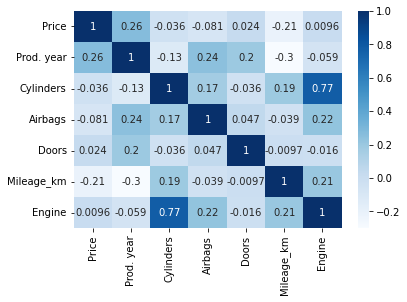

In [279]:
sns.heatmap(correlation_vals,cmap='Blues',annot=True)

In [178]:
# dff.head()
dff['Category'].unique()

array(['Jeep', 'Hatchback', 'Sedan', 'Goods wagon', 'Microbus',
       'Universal', 'Coupe', 'Minivan', 'Cabriolet', 'Limousine',
       'Pickup'], dtype=object)

In [179]:
dff['Category'].value_counts()

Sedan          7695
Jeep           4602
Hatchback      2631
Minivan         603
Coupe           459
Universal       332
Microbus        246
Goods wagon     202
Pickup           37
Cabriolet        30
Limousine        11
Name: Category, dtype: int64

In [180]:
## Change the Category to only few like SUV, Sedan Other
# dff.loc[(dff['Category']=='Jeep'),'Category'] = 'SUV'
dff.loc[~((dff['Category']=='Sedan')|(dff['Category']=='Jeep')), 'Category'] = 'Other'

In [181]:
dff['Category'].value_counts()

Sedan    7695
Jeep     4602
Other    4551
Name: Category, dtype: int64

### OHE 


In [182]:
dff2 = pd.get_dummies(dff,columns=['Fuel type','Category','Gear box type','Color','Drive wheels','Leather interior'])#,drop_first = True)

In [183]:
# dff2

In [184]:
### Train Test Split
x = dff[['Prod. year','Mileage_km']]
# x = dff[['Prod. year','Mileage_km']]
y = dff['Price']
x_train,x_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=22)

In [185]:
print(x_train.shape,y_train.shape)

(13478, 2) (13478,)


In [186]:
print(x_test.shape,y_test.shape)

(3370, 2) (3370,)


### Linear Regression only on the numeric columns

In [187]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
model1 = lr.fit(x_train,y_train)


In [188]:
y_pred = model1.predict(x_test)

In [189]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

r2score = r2_score(y_test,y_pred)
print(f'r2 score = {r2score}')

r2 score = 0.09122279160081948


In [190]:
### Try same 2 columns with normalized dataset
from sklearn.preprocessing import MinMaxScaler

data1 = dff[['Prod. year','Mileage_km','Airbags','Cylinders','Doors']].copy()
# print(data1)
dat_dff = data1.copy()
dat_dff['Price'] = dff['Price']

scaler = MinMaxScaler()
# scaler.fit(x_train)
scaler.fit_transform(data1)

array([[0.87654321, 0.51010831, 0.75      , 0.33333333, 0.66666667],
       [0.88888889, 0.52655988, 0.5       , 0.33333333, 0.66666667],
       [0.82716049, 0.5485136 , 0.125     , 0.2       , 0.66666667],
       ...,
       [0.87654321, 0.31900122, 0.25      , 0.2       , 0.66666667],
       [0.83950617, 0.14033364, 0.25      , 0.2       , 0.66666667],
       [0.90123457, 0.5126275 , 0.75      , 0.2       , 0.66666667]])

In [191]:
dat_dff.corr()

,Prod. year,Mileage_km,Airbags,Cylinders,Doors,Price
Prod. year,1.000000,-0.301205,0.243926,-0.126862,0.196054,0.263606
Mileage_km,-0.301205,1.000000,-0.039104,0.187277,-0.009716,-0.214213
Airbags,0.243926,-0.039104,1.000000,0.169972,0.047200,-0.080852
Cylinders,-0.126862,0.187277,0.169972,1.000000,-0.035831,-0.035787
Doors,0.196054,-0.009716,0.047200,-0.035831,1.000000,0.024219
Price,0.263606,-0.214213,-0.080852,-0.035787,0.024219,1.000000


In [192]:
x_train,x_test,y_train,y_test = train_test_split(data1[['Prod. year','Mileage_km']],dff['Price'] , test_size = 0.2,random_state=21)
x_train.shape,y_train.shape

((13478, 2), (13478,))

In [193]:
x_test.shape,y_test.shape

((3370, 2), (3370,))

In [194]:
lr2 = LinearRegression()

model1 = lr2.fit(x_train,y_train)
ypred2 = model1.predict(x_test)

In [195]:
score_2 = r2_score(y_test,ypred2)
score_2

0.09275213995276821

In [196]:
mse_lin_1 = mean_squared_error(y_test, ypred2)

In [197]:
mae1 = mean_absolute_error(y_test, ypred2)

In [198]:
ypred2ser = pd.DataFrame(ypred2)

In [199]:
y_orig = y_test.reset_index()
y_orig.drop('index',axis=1,inplace=True)

In [200]:
xz = y_orig.join(ypred2ser)
xz.rename({0:'Predicted', 'Price':'Actual_price'},axis=1,inplace=True)

In [201]:
# plt.plot(xz.index,xz['Predicted'],color='r')
# plt.plot(xz.index,xz['Actual_price'],color='b')
# plt.show()

### MLR on selected categorical & continuous variable columns


In [280]:
# dff2.corr()[(dff2.corr()>=0.1) | (dff2.corr()<=-0.1)]['Price']
dff2.corr()['Price']

Price                         1.000000
Prod. year                    0.263606
Cylinders                    -0.035787
Airbags                      -0.080852
Doors                         0.024219
Mileage_km                   -0.214213
Engine                        0.009649
Fuel type_Diesel              0.266312
Fuel type_OtherFuel          -0.178610
Fuel type_Petrol             -0.060114
Category_Jeep                 0.171416
Category_Other               -0.025825
Category_Sedan               -0.130313
Gear box type_Automatic      -0.091040
Gear box type_Manual         -0.091856
Gear box type_OtherGearbox    0.170322
Color_Black                   0.002569
Color_OtherColor             -0.002569
Drive wheels_4x4             -0.057847
Drive wheels_Front            0.063556
Drive wheels_Rear            -0.019834
Leather interior_No          -0.075573
Leather interior_Yes          0.075573
Name: Price, dtype: float64

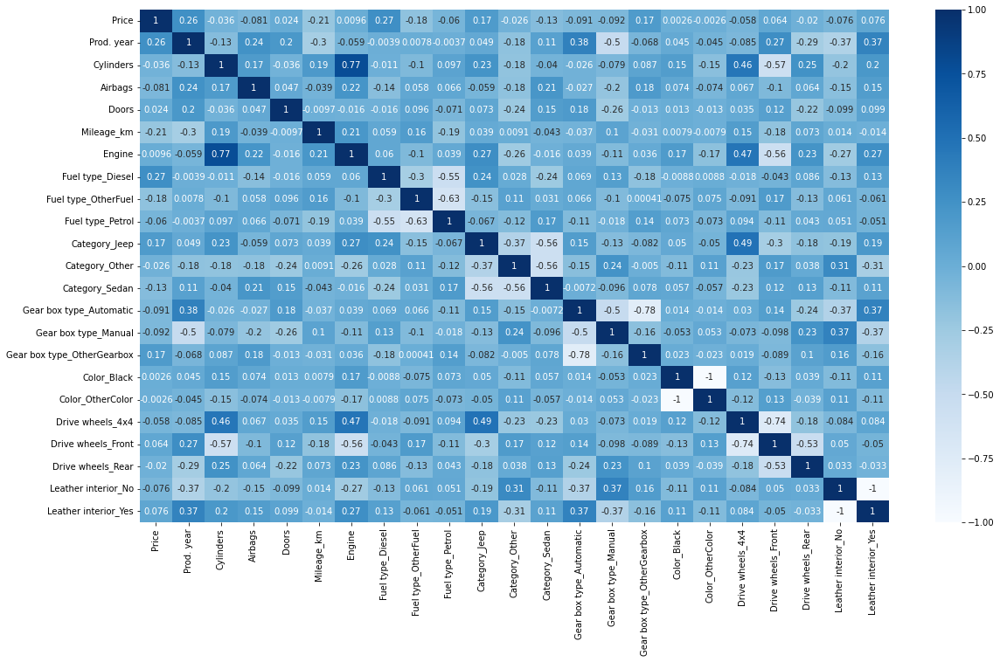

In [287]:
corr2 = dff2.corr()
fig,ax = plt.subplots(figsize=(19.2,10.8))
fig = sns.heatmap(corr2,cmap='Blues',annot=True)

In [286]:
# px.imshow(corr2,text_auto=True)

In [203]:
dff_mlr = dff2[['Gear box type_OtherGearbox','Category_Sedan','Category_Jeep','Prod. year','Mileage_km','Fuel type_Diesel','Fuel type_OtherFuel']].copy()

# dff_mlr
#x - dff_mlr
dff_mlr_target = dff2['Price']
# dff_mlr,dff_mlr_target

In [204]:
scaler2 = MinMaxScaler()
data2 = scaler2.fit_transform(dff_mlr)

In [205]:
x2_train, x2_test, y2_train,y2_test = train_test_split(data2,dff_mlr_target,test_size = 0.2, random_state=33)
x2_train.shape,y2_train.shape,x2_test.shape,y2_test.shape

((13478, 7), (13478,), (3370, 7), (3370,))

In [206]:
lr3 = LinearRegression()
model2 = lr3.fit(x2_train,y2_train)
y2_prediction = model2.predict(x2_test)

In [207]:
mlr_r2score = r2_score(y2_test,y2_prediction)
mlr_mse = mean_squared_error(y2_test, y2_prediction)

In [208]:
mlr_mse

100382010.01987593

In [209]:
mlr_r2score

0.25366774899915845

In [210]:
rmse2 = np.sqrt(mlr_mse)
rmse2
# This signifies how far off we might be with our predictions from the actual price

10019.082294296017

In [211]:
## Graph comparison on the performance difference
## R2 Score and MSE score difference needs to be shown on graph to show improvement in the predictions
### State the reason like data not distributed normal -> leading to lowr2 score and very high mse score

In [212]:
mae2 = mean_absolute_error(y2_test, y2_prediction)
mae2

7945.56501240721

## Random Forest Regressor -> BEST

In [213]:
from sklearn.ensemble import RandomForestRegressor

In [214]:
dff_rfr = dff2[['Gear box type_OtherGearbox','Category_Sedan','Category_Jeep','Prod. year','Mileage_km','Fuel type_Diesel','Fuel type_OtherFuel']].copy()
dff_rfr_target = dff2['Price']

In [215]:
scaler_rfr = MinMaxScaler()
data_rfr = scaler_rfr.fit_transform(dff_rfr)

In [216]:
x4_train, x4_test, y4_train,y4_test = train_test_split(data_rfr,dff_rfr_target,test_size = 0.2, random_state=33)
x4_train.shape,y4_train.shape,x4_test.shape,y4_test.shape

((13478, 7), (13478,), (3370, 7), (3370,))

In [217]:
rfr_model = RandomForestRegressor(n_estimators=128, random_state=111)

In [218]:
rfr_model.fit(x4_train,y4_train)
rfr_preds = rfr_model.predict(x4_test)

In [219]:
rfr_r2score = r2_score(y4_test,rfr_preds)
rfr_mse = mean_squared_error(y4_test, rfr_preds)
rfr_mae = mean_absolute_error(y4_test, rfr_preds)

In [220]:
rfr_mae

5470.819139510936

In [221]:
rfr_mse

67839854.11035953

In [222]:
rfr_r2score

0.4956160868294206

In [223]:
rfr_rmse = np.sqrt(rfr_mse)
rfr_rmse

8236.49525650076

### Polynomial Regression

In [224]:
dff_poly = dff2[['Gear box type_OtherGearbox','Category_Sedan','Category_Jeep','Prod. year','Mileage_km','Fuel type_Diesel','Fuel type_OtherFuel']].copy()

dff_poly_target = dff2['Price']

In [225]:
scaler3 = MinMaxScaler()
data3 = scaler3.fit_transform(dff_poly)

In [226]:
x3_train, x3_test, y3_train,y3_test = train_test_split(data3,dff_poly_target,test_size = 0.2, random_state=33)
x3_train.shape,y3_train.shape,x3_test.shape,y3_test.shape

((13478, 7), (13478,), (3370, 7), (3370,))

In [227]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(degree = 5)
x_poly = poly.fit_transform(x3_train)
poly.fit(x_poly,y3_train)
poly_lin = LinearRegression()
model3 = poly_lin.fit(x_poly,y3_train)

In [228]:
y2_pred_poly = model3.predict(poly.fit_transform(x3_test))

In [229]:
poly_r2score = r2_score(y3_test,y2_pred_poly)
poly_mse = mean_squared_error(y3_test, y2_pred_poly)

In [230]:
poly_r2score

0.3883436944391928

In [231]:
poly_mse

82268037.20620136

In [232]:
rmse_poly = np.sqrt(poly_mse)
rmse_poly
# This signifies how far off we might be with our predictions from the actual price

9070.172942463741

In [233]:
mae_poly = mean_absolute_error(y3_test, y2_pred_poly)

## Insights and Data Distribution like Top 3 values etc.

### Comparison of the various LR vs MLR vs Poly vs Random Forest Regressor

In [234]:
rmse_list = (np.sqrt(mse_lin_1),rmse2,rmse_poly,rfr_rmse)

In [235]:
r2_list = (score_2, mlr_r2score, poly_r2score,rfr_r2score)

In [236]:
mae_list = (mae1,mae2,mae_poly,rfr_mae)

In [237]:
mse_list = (mse_lin_1,mlr_mse, poly_mse,rfr_mse)

In [238]:
model_names = ['MLR on Continuous','MLR on Cat+Cont','Polynomial Regression','Random Forest Regressor']

In [239]:
tmp1 = pd.DataFrame({
    'Model':model_names,'Mean Absolute Error':mae_list
})
# tmp1

In [240]:
# This signifies how far off we might be with our predictions from the actual price
tmp2 = pd.DataFrame({
    'Model':model_names,'RMSE':rmse_list
})
# tmp2

In [241]:
tmp3 = pd.DataFrame({
    'Model':model_names,'R2 Score':r2_list
})
# tmp3

In [242]:
tmp4 = pd.DataFrame({
    'Model':model_names,'Mean Squared Error':mse_list
})
# tmp4

In [243]:
## Barplots

In [244]:
# px.colors.qualitative.Pastel1

In [245]:

px.bar(tmp1,x='Model',y='Mean Absolute Error',color='Model',text_auto=True,
       color_discrete_sequence=px.colors.qualitative.Set1)
# pattern_shape='Model',pattern_shape_sequence=["x","x","x"],

In [246]:
px.bar(tmp2,x='Model',y='RMSE',color='Model',text_auto=True,
      color_discrete_sequence=px.colors.qualitative.Set1)
# pattern_shape='Model',pattern_shape_sequence=["x","x","x"],color_discrete_sequence=px.colors.qualitative.Set1

In [247]:
px.bar(tmp3,x='Model',y='R2 Score',color='Model',text_auto=True,
      color_discrete_sequence=px.colors.qualitative.Set1)
# pattern_shape='Model',pattern_shape_sequence=["x","x","x"],

In [248]:
px.bar(tmp4, x= 'Model',y='Mean Squared Error', color = 'Model', text_auto=True,
      color_discrete_sequence=px.colors.qualitative.Set1)

#### Explain 
1. How and what steps I followed                                               ---Done---
2. Which regression model is better                                            ---Done--- 
3. Why are the loss high and r2 score low                                      ---Done---        
4. Which columns did I take and why                                            ---Done---  
5. Graphs on performance difference                                            ---Done---  
6. Graphs explained with insights                                              .
7. About this dataset                                               
    - Interesting points about each columns                                     .         
    - eg: Insights like top 3 or 5 manufacturer for sale                        .                     
    - price to other columns graphs and relations                               .                
    - Final Result on trying to achieve better results                          .                    
8. Clean extra code and only have a comment on each of the steps and graph     .                                         
9. Make the documentation with extra emphasis on explainablity                 .                              
10. Reinforce and re-check the insights validity and accuracy.                 .                             
11. Look for the correct way to approach anything .                            --- Done. Improved Results ---                  
12. Make a few more boxplots,etc.                                              --- DONE ---
13. Future Work                                                                --- DONE ---

In [249]:
## Show all these Values in Power Bi Dashboard

### Information about my Results ###

I used the boxplots to check if the continuous variables are inside a proper range

- When the median is in the middle of the box, and the whiskers are about the same on both sides of the box, then the distribution is symmetric.
- When the median is closer to the bottom of the box, and if the whisker is shorter on the lower end of the box, then the distribution is positively skewed (skewed right).
- When the median is closer to the top of the box, and if the whisker is shorter on the upper end of the box, then the distribution is negatively skewed (skewed left).

Columns Updated wrt to the Boxplots are:
1. Price 
2. Engine
3. Mileage (km)



#### Columns Cleaned and updated
- Selected Columns are:
    1. Price (Target)
    2. Prod. year
    3. Mileage
    4. Gearbox type (OHE)
    5. Category (OHE)
    6. Fuel Type (OHE)
- Other columns are not considered because extremely weak correlation with target column PRICE. 

##### Columns I have taken on the basis of the correlation. 
- Any thing with less than 10% correlation is dropped and since the max correlation between price and other columns is ~0.25, the linear regression model might not be the best suited method to use.
- The regression model will definately not yield great accurate results, however, we can still see the performance improvement amongst multiple techniques such as taking continuous and both categorical variables 
- The polynomial regression can also be a good test to check out if it is better than the normal regression model.

##### Future Work:
- It would be better to apply the Neural Network and Other ensembling model techniques to the data and look if any complex model can be more accurate with the predictions
- However, the complex models also would lack the explainablity and hence the performance will be considered better or worse after looking at if explainability is important or not.

#### Looking at the different Performance Metrics
1. MAE (Mean Absolute Error)
    - Least vslue is achieved for the random forest regressor followed by the 5 degree polynomial regression on continuous + categorical data.
    - Followed by MLR on Categorical and Continuous 
    - The highest MAE is for the LR model on the continuous data alone (ignoring all the categorical features)
    
2. RMSE and MSE follow the same trend as that followed in the MAE
3. R2 Score
    - The R2 Score is highest for randome forest regressor at 0.495 followed by polynomial regression model at 0.38 followed by the other two models.
    - The difference can be seen in the graphs

::

- R-squared is the percentage of the dependent variable variation that a linear model explains.
- R-squared is a goodness-of-fit measure for linear regression models. This statistic indicates the percentage of the variance in the dependent variable that the independent variables explain collectively. 
- R-squared measures the strength of the relationship between your model and the dependent variable on a convenient 0 – 100% scale.  R-squared is always between 0 and 100%: 
    1. 0% represents a model that does not explain any of the variation in the response variable around its mean. The mean of the dependent variable predicts the dependent variable as well as the regression model. 
    2. 100% represents a model that explains all the variation in the response variable around its mean. 
- Usually, the larger the R2, the better the regression model fits your observations.


::

##### This dataset wasn't a good data to predict prices using a simple model like linear regression as the R2 scores also reflect. However, I wanted to check how the performance can be made better by optimising and using even the categorical variables. 
##### The results reflect how important it was to consider botht the categorical and continuous variables. The R2 score is 5 times more than for random forest regressor as compared to that of the multiple linear regression model only continuous variables.

In [250]:
df_fin.columns

Index(['Price', 'Levy', 'Manufacturer', 'Model', 'Prod. year', 'Category',
       'Leather interior', 'Fuel type', 'Engine volume', 'Mileage',
       'Cylinders', 'Gear box type', 'Drive wheels', 'Wheel', 'Color',
       'Airbags', 'Doors', 'Mileage_km', 'Engine'],
      dtype='object')

In [291]:
# print(tmp2);print('\n');print(tmp3);print('\n');print(tmp4);print('\n');
tmp1

,Model,Mean Absolute Error
0,MLR on Continuous,8711.701170
1,MLR on Cat+Cont,7945.565012
2,Polynomial Regression,6851.329972
3,Random Forest Regressor,5470.819140


In [292]:
tmp2

,Model,RMSE
0,MLR on Continuous,11290.544152
1,MLR on Cat+Cont,10019.082294
2,Polynomial Regression,9070.172942
3,Random Forest Regressor,8236.495257


In [293]:
tmp3

,Model,R2 Score
0,MLR on Continuous,0.092752
1,MLR on Cat+Cont,0.253668
2,Polynomial Regression,0.388344
3,Random Forest Regressor,0.495616


In [294]:
tmp4

,Model,Mean Squared Error
0,MLR on Continuous,1.274764e+08
1,MLR on Cat+Cont,1.003820e+08
2,Polynomial Regression,8.226804e+07
3,Random Forest Regressor,6.783985e+07


In [252]:
# from statsmodels.api import OLS
# OLS(y2_test,x2_test).fit().summary()

In [253]:
# OLS(y_test,x_test).fit().summary()

In [254]:
# model1.intercept_,model1.coef_

In [255]:
# model2.intercept_,model2.coef_

In [256]:
# model3.intercept_,model3.coef_

In [257]:
# x3_test
dff_poly

,Gear box type_OtherGearbox,Category_Sedan,Category_Jeep,Prod. year,Mileage_km,Fuel type_Diesel,Fuel type_OtherFuel
0,0,0,1,2010,186005.0,0,1
1,1,0,1,2011,192000.0,0,0
2,1,0,0,2006,200000.0,0,0
3,0,0,1,2011,168966.0,0,1
4,0,0,0,2014,91901.0,0,0
...,...,...,...,...,...,...,...
19232,0,0,0,1999,300000.0,0,1
19233,1,1,0,2011,161600.0,0,0
19234,0,0,1,2010,116365.0,1,0
19235,0,0,1,2007,51258.0,1,0


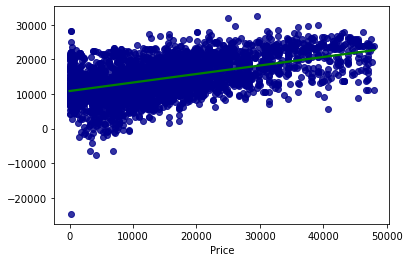

In [258]:
import seaborn as sns

sns.regplot(x=y2_test, y=y2_prediction, ci=None, scatter_kws={"color": "darkblue"}, line_kws={"color": "green"})
plt.show()

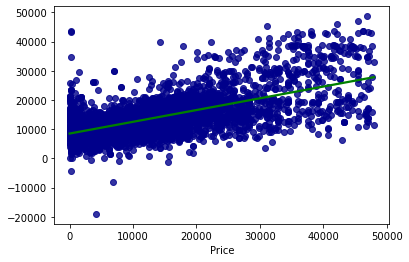

In [259]:
sns.regplot(x=y3_test, y=y2_pred_poly, ci=None, scatter_kws={"color": "darkblue"}, line_kws={"color": "green"})
plt.show()

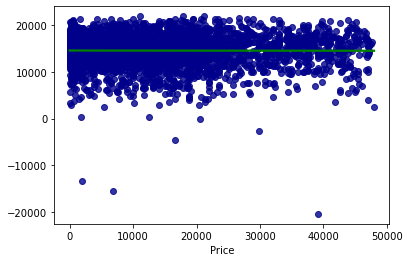

In [260]:
sns.regplot(x=y_test, y=y_pred, ci=None, scatter_kws={"color": "darkblue"}, line_kws={"color": "green"})
plt.show()

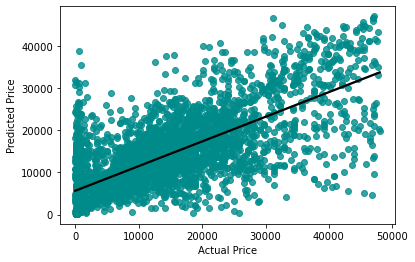

In [300]:
sns.regplot(x=y4_test, y=rfr_preds, ci=None, scatter_kws={"color": "darkcyan"}, line_kws={"color": "Black"})
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.show()